## 3D model with annotations - https://wikibase.wbworkshop.tibwiki.io/wiki/Item:Q469

This page shows a 3D model .obj file using the obj2html Python library found at https://z-uo.medium.com/visualize-3d-model-in-jupyter-notebook-e5a9deca20c6. This converts a .obj file to HTML and then displays the HTML.

This is currently using a 9.9 MB test model object because the dining room 3D model is 148.6 MB and is currently not working with this script.

In [56]:
from obj2html import obj2html
from IPython.display import display, HTML

obj2html('model.obj', 'model.html')
#obj2html('Tafelstube_Final_4_JL_US.obj', 'model.html')

display(HTML('model.html'))

The below code performs a SPARQL query to get the annotations for a specific target entity, in this case Q446 'Weikersheim, Dining room CAD model' (https://wikibase.wbworkshop.tibwiki.io/wiki/Item:Q446).

In [57]:
#| echo: false
#| output: false

import sparql_dataframe

# Specify the NFDI4Culture Wikibase SPARQL endpoint
endpoint_url = 'https://query.wbworkshop.tibwiki.io/proxy/wdqs/bigdata/namespace/wdq/sparql'

# Query
query = """
SELECT ?annotation ?annotationLabel ?description ?title
WHERE { 
    ?annotation tibt:P50 tib:Q446.
    ?annotation schema:description ?description.
    ?annotation tibt:P30 ?title
    SERVICE wikibase:label { bd:serviceParam wikibase:language "[AUTO_LANGUAGE],en". }
}
#All annotations for a specific target entity"
"""

dataframe = sparql_dataframe.get(endpoint_url, query, post=True)

dataframe

,annotation,annotationLabel,description,title


The below code produces a QR code for this page.

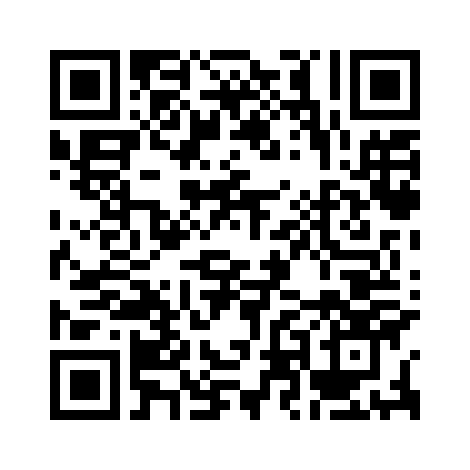

In [58]:
from PIL import Image
import qrcode

# Link for website
input_data = "https://nfdi4culture.github.io/cp4c/model_with_annotations.html"

#Creating an instance of qrcode
qr = qrcode.QRCode(
        version=1,
        box_size=10,
        border=5)
qr.add_data(input_data)
qr.make(fit=True)
img = qr.make_image(fill='black', back_color='white')

display(img)